## 拟合到这里，说明针对这个数据集，线性模型是可以拟合的

## 下面换一个更复杂的数据集


In [2]:
import pandas as pd

In [3]:
timeserise_sales = pd.read_csv('time_serise_sale.csv')

In [4]:
timeserise_sales.head()

,Unnamed: 0,week_1,week_2,week_3,week_4,week_5,week_6,week_7,week_8,week_9,...,week_43,week_44,week_45,week_46,week_47,week_48,week_49,week_50,week_51,week_52
0,0,2.291574,2.882838,3.581805,4.013875,1.109924,2.834247,2.625045,2.196884,4.208887,...,1.242250,2.771072,3.778143,3.161634,3.792645,2.015481,2.826184,2.520788,2.637210,2.748923
1,1,0.609664,2.523604,2.609537,3.695997,3.399272,2.616612,1.651935,1.348295,3.862523,...,2.477505,2.284513,3.461783,3.101052,3.442420,1.915776,2.426168,1.662855,2.481925,2.411202
2,2,3.422793,1.812651,-0.097966,1.724064,3.093660,1.781278,2.849946,2.949707,3.560835,...,2.219667,2.359834,1.932029,2.731947,1.836245,1.219933,1.222740,1.720052,2.169939,2.161702
3,3,3.372283,2.577254,3.854308,3.449679,2.517676,2.635679,2.352706,2.856216,1.948434,...,1.670912,0.909113,3.216652,1.775346,3.270484,2.399709,3.032071,1.703666,1.750585,1.821736
4,4,2.997727,1.799415,3.648090,2.391567,2.376778,1.864717,0.408062,2.346726,3.260303,...,2.304058,3.038905,2.038733,2.825186,2.232937,2.509050,2.881796,-1.712131,2.140366,1.926818


In [5]:
timeserise_sales = timeserise_sales.set_index('Unnamed: 0')
timeserise_sales.index.name = None
timeserise_sales.head()

,week_1,week_2,week_3,week_4,week_5,week_6,week_7,week_8,week_9,week_10,...,week_43,week_44,week_45,week_46,week_47,week_48,week_49,week_50,week_51,week_52
0,2.291574,2.882838,3.581805,4.013875,1.109924,2.834247,2.625045,2.196884,4.208887,2.969051,...,1.242250,2.771072,3.778143,3.161634,3.792645,2.015481,2.826184,2.520788,2.637210,2.748923
1,0.609664,2.523604,2.609537,3.695997,3.399272,2.616612,1.651935,1.348295,3.862523,2.061477,...,2.477505,2.284513,3.461783,3.101052,3.442420,1.915776,2.426168,1.662855,2.481925,2.411202
2,3.422793,1.812651,-0.097966,1.724064,3.093660,1.781278,2.849946,2.949707,3.560835,2.813926,...,2.219667,2.359834,1.932029,2.731947,1.836245,1.219933,1.222740,1.720052,2.169939,2.161702
3,3.372283,2.577254,3.854308,3.449679,2.517676,2.635679,2.352706,2.856216,1.948434,1.484706,...,1.670912,0.909113,3.216652,1.775346,3.270484,2.399709,3.032071,1.703666,1.750585,1.821736
4,2.997727,1.799415,3.648090,2.391567,2.376778,1.864717,0.408062,2.346726,3.260303,2.645002,...,2.304058,3.038905,2.038733,2.825186,2.232937,2.509050,2.881796,-1.712131,2.140366,1.926818


In [7]:
import matplotlib.pyplot as plt

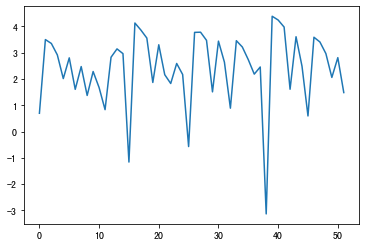

In [8]:
plt.plot(timeserise_sales.sample().values[0]) # 数据更乱一些，规律性弱一些

In [12]:
import torch
import torch.nn as nn #nn是torch的neural network
import numpy as np

In [13]:
# 建立一个全连接模型
# 每个pytorch的model必须得是pytorch的一个子类，因为要进行forward，调整参数等
class FullyConnected(nn.Module):
    def __init__(self, x_size, hidden_size, output_size): # 输入n*10,hidden layer,输出n*10
        # super() 函数是用于调用父类(超类)的一个方法。super() 是用来解决多重继承问题的
        super(FullyConnected, self).__init__() # 父类里有初始化非方法，在定义新的的时候，要让父类初始化。
        self.hidden_size = hidden_size

        self.linear_with_tanh = nn.Sequential( # 两层神经网络
            nn.Linear(x_size, self.hidden_size), # 线性变换 wx+b
            nn.Tanh(), # 非线性变换，激活函数
            nn.Linear(self.hidden_size, self.hidden_size),
            nn.Tanh(),
            nn.Linear(self.hidden_size, output_size)
        )
        
    def forward(self, x):
        yhat = self.linear_with_tanh(x)
        
        return yhat

In [15]:
from torch import optim 

In [18]:
# 随机取sample_size个数据
def sample_from_table(sample_size, dataframe):
    sample_row = dataframe.sample().values[0]
    
    begin_column = random.randint(0, len(sample_row) - sample_size - 1) 
    
    choosen_data = sample_row[begin_column:begin_column+sample_size+1]
    
    return (choosen_data[:sample_size], choosen_data[1:])

In [20]:
import random

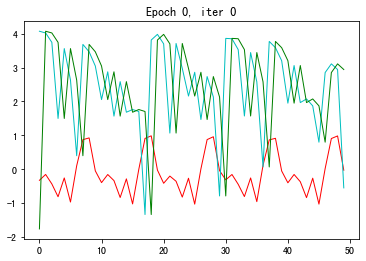

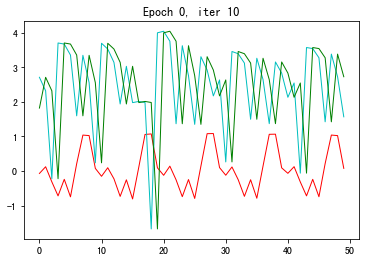

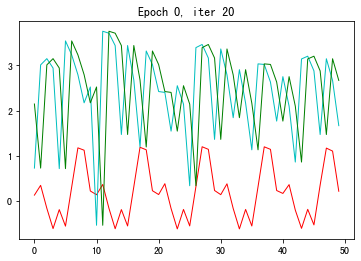

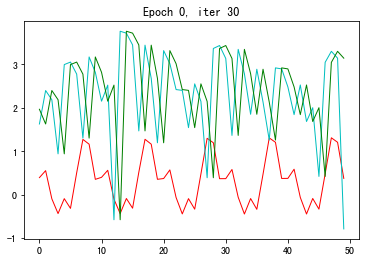

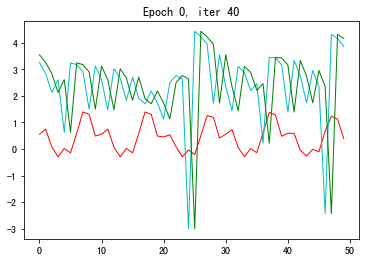

...

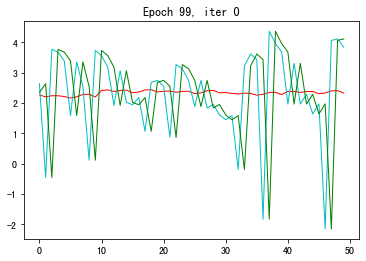

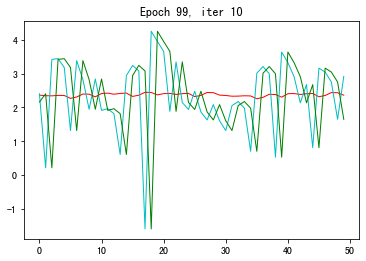

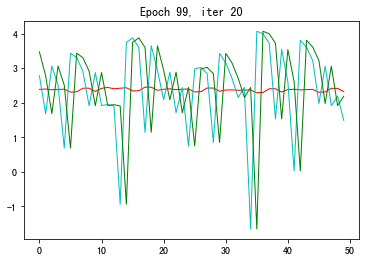

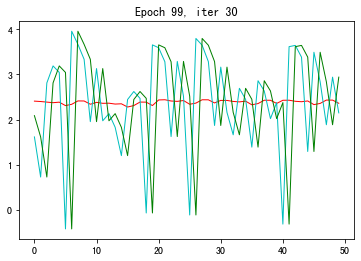

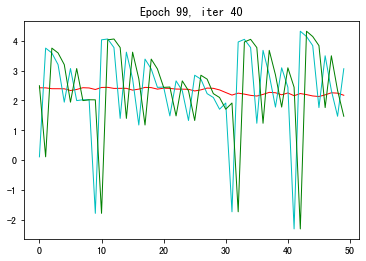

In [21]:
fc_model = FullyConnected(x_size=10, hidden_size=3, output_size=10)
fc_model = fc_model.double()

criterion = nn.MSELoss() # LOSS

# 除了梯度下降，还有很多别的优化方法，此处用的SGD
optimizer = optim.SGD(fc_model.parameters(),lr=0.01)

n_epochs = 100

losses = np.zeros(n_epochs)

n_iters = 50


for epoch in range(n_epochs):
    for iter_ in range(n_iters):
        inputs_,targets_ = sample_from_table(50, timeserise_sales)

        inputs = torch.from_numpy(np.array([
                        inputs_[0:10], 
                        inputs_[10:20], 
                        inputs_[20:30], 
                        inputs_[30:40], 
                        inputs_[40:50]], dtype=np.double)) # 输入

        targets = torch.from_numpy(np.array([
                        targets_[0:10], 
                        targets_[10:20], 
                        targets_[20:30], 
                        targets_[30:40], 
                        targets_[40:50]], dtype=np.double)) # 输出

        outputs = fc_model(inputs) # yhat

        loss = criterion(outputs,targets) # loss

        # torch在训练的时候，会默认在每一轮训练的时候，把上一轮训练的梯度留下来，下一次求得的梯度加上它形成新的梯度，某些情况适用，此处不需要
        # 梯度清零，不然会出错
        optimizer.zero_grad() 

        loss.backward() # 反向传播

        optimizer.step() # 更新权值

        losses[epoch] += loss

        if iter_ % 10 == 0:
            plt.clf()
            plt.ion()

            plt.title("Epoch {}, iter {}".format(epoch, iter_))

            plt.plot(torch.flatten(outputs.detach()),'r-',linewidth=1,label='Output') # 预测数据 - 红色
            plt.plot(torch.flatten(targets),'c-',linewidth=1,label='Label') # 真实数据 - 浅蓝
            plt.plot(torch.flatten(inputs),'g-',linewidth=1,label='Input') # 输入数据 - 绿色

            plt.draw();
            plt.pause(0.05);

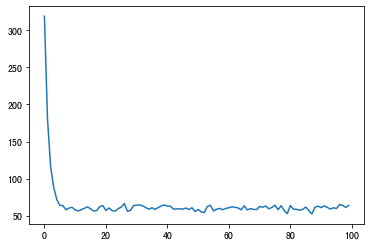

In [22]:
plt.plot(losses)

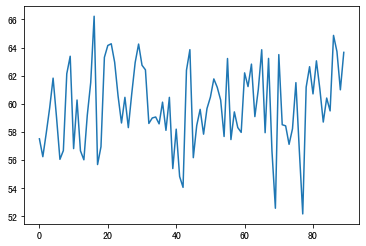

In [23]:
plt.plot(losses[10:])

## 拟合的不好
+ hidden_size=3更改为32，尝试一下
+ 也可以尝试把FullyConnected层数变多一些

```python
class FullyConnected(nn.Module):
    def __init__(self, x_size, hidden_size, output_size): # 输入n*10,hidden layer,输出n*10
        super(FullyConnected, self).__init__() # 父类里有初始化非方法，在定义新的的时候，要让父类初始化。
        self.hidden_size = hidden_size

        self.linear_with_tanh = nn.Sequential( # 两层神经网络
            nn.Linear(x_size, self.hidden_size), # 线性变换 wx+b
            nn.Tanh(), # 非线性变换，激活函数
            nn.Linear(self.hidden_size, self.hidden_size),
            nn.Tanh(),
            nn.Linear(self.hidden_size, output_size)
        )
        
    def forward(self, x):
        yhat = self.linear_with_tanh(x)
        
        return yhat
```

+ 增加hidden_size后拟合的效果会好一些，由于运行后文件太大，无法上传到github，固此处删除运行结果

## 有没有其他更好的预测方法，怎么样才能让它有一个比较好的拟合效果

#### 全连接模型中，$y = \sigma(w*x+b)$, y只和当前的x有关系，而没有把依赖关系考虑进去

#### 科学家就提出了新的模型 Recurrent Neural Networks 循环神经网络

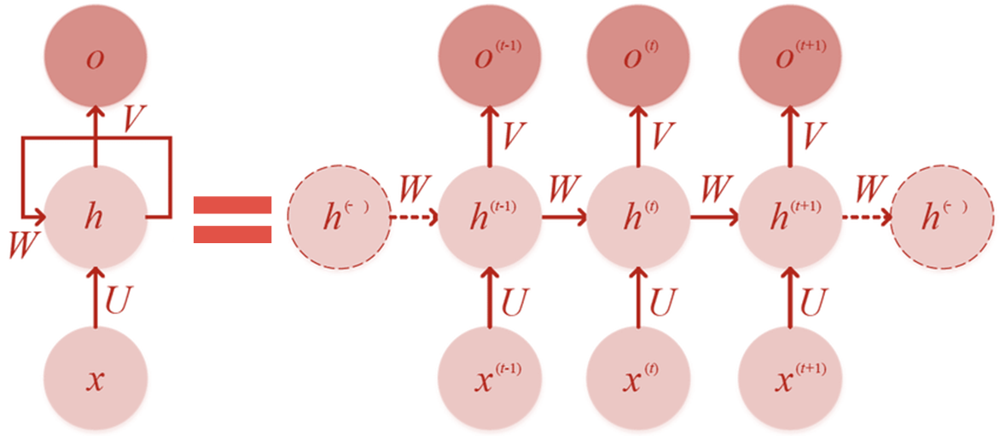

#### 问题：在计算$x_t$时，怎么把$x_{t-1}$也用进去

Previous we tree the neural networks as：
+ $𝑦_𝑡=𝜎(𝑊𝑥_𝑡+𝑏)$
+ $𝑦_{𝑡+1}=𝜎(𝑊𝑥_{𝑡+1}+𝑏)$

Now We treat the neural networks as: 

+ Elman network:
$$ℎ_𝑡=𝜎_ℎ (𝑊_ℎ 𝑥_𝑡+𝑈_ℎ ℎ_{𝑡−1}+𝑏_ℎ )$$
$$𝑦_𝑡=𝜎_𝑦 (𝑊_𝑦 ℎ_𝑡+𝑏_𝑦)$$

其中，$𝑊_ℎ$对应上图中的$U$,$𝑈_ℎ$对应上图中的$W$,$𝑊_𝑦$对应上图中的$V$

$$\begin{array}{ll}
    &𝑦_𝑡\\
    &=𝜎_𝑦 (𝑊_𝑦 ℎ_𝑡+𝑏_𝑦)\\
    &=𝜎_𝑦 (𝑊_𝑦 𝜎_ℎ (𝑊_ℎ 𝑥_𝑡+𝑈_ℎ ℎ_{𝑡−1}+𝑏_ℎ )+𝑏_𝑦)\\
    &=𝜎_𝑦 (𝑊_𝑦 𝜎_ℎ (𝑊_ℎ 𝑥_𝑡+𝑈_ℎ 𝜎_ℎ (𝑊_ℎ 𝑥_{𝑡−1}+𝑈_ℎ ℎ_{𝑡−2}+𝑏_ℎ )+𝑏_ℎ )+𝑏_𝑦)
\end{array}$$

Or
+ Jordan networks:
$$ℎ_𝑡=𝜎_ℎ (𝑊_ℎ 𝑥_𝑡+𝑈_ℎ 𝑦_{𝑡−1}+𝑏_ℎ )$$
$$𝑦_𝑡=𝜎_𝑦 (𝑊_𝑦 ℎ_𝑡+𝑏_𝑦)$$